# Plot marker genes

In [1]:
here::i_am("rna/regression/regress_variables.R")

source(here::here("settings.R"))
source(here::here("utils.R"))

suppressPackageStartupMessages(library(scran))
suppressPackageStartupMessages(library(scater))
suppressPackageStartupMessages(library(Seurat))

BPPARAM <- BiocParallel::bpparam()
BPPARAM$workers = 24

# Multi core using future - built in to seurat
plan("multicore", workers = 24)
options(future.globals.maxSize = 50 * 1024 ^ 3) # for 50 Gb RAM

args = list()
args$rna_metadata = file.path(io$basedir, 'results/rna/doublet_detection/sample_metadata_after_doublets.txt.gz')

args$outdir = file.path(io$basedir, 'results/rna/marker_scores/')

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/code



# Get Marker scores

In [2]:
# Markers
markers = fread(sprintf('%s/celltype_extended_markers.txt.gz', args$outdir))
markers$celltype = gsub('-', '_', gsub(' ', '_', gsub('/', '_', markers$celltype))) # remove spaces from cellnames

# metadata
sample_metadata <- fread(args$rna_metadata) %>%
  .[pass_rnaQC==TRUE & doublet_call==FALSE]

# SCE
sce <- load_SingleCellExperiment(io$rna.sce, cells=sample_metadata$cell, normalise = TRUE)

In [34]:
# Markers V2
files = list.files(file.path(io$basedir, '/results/rna/marker_scores/'), pattern='celltype_extended_markers_')
markers = lapply(paste0(file.path(io$basedir, '/results/rna/marker_scores/', files)), fread) %>%
    rbindlist() %>%
    .[sig==TRUE & cdr>=0.3] %>%
    .[order(-logFC)]

In [5]:
# seurat
seurat = as.Seurat(sce)

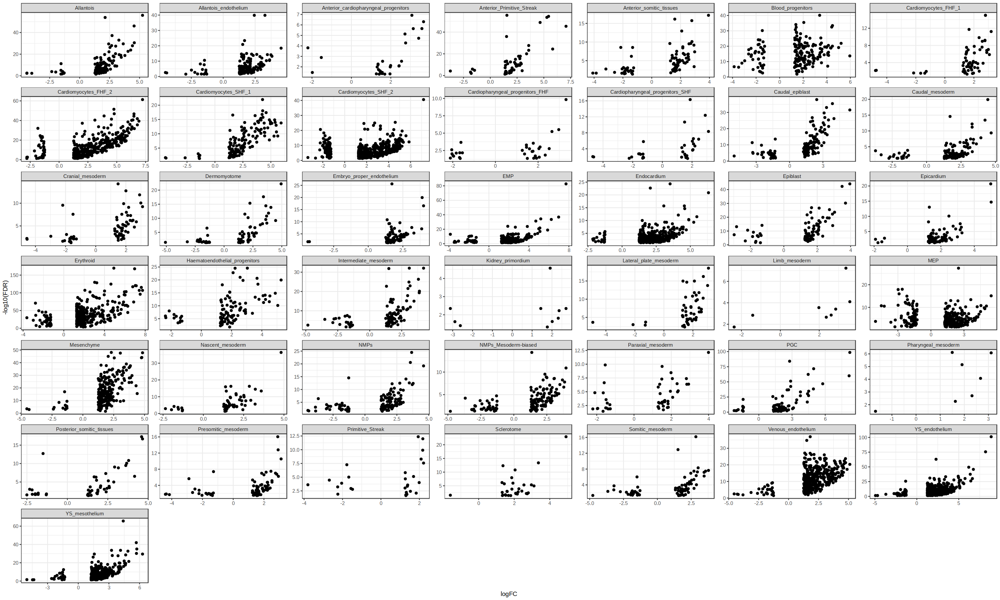

In [40]:
options(repr.plot.width=25, repr.plot.height=15)
ggplot(markers[sig==T], aes(logFC, -log10(FDR))) +
    geom_point() + 
    facet_wrap(~celltype, scales = "free") + 
    theme_bw()
options(repr.plot.width=8, repr.plot.height=5)


In [49]:
features = mclapply(unique(markers$celltype), function(x){
    tmp = markers[celltype==x & sig==TRUE] %>%
        .[order(-logFC),] %>% head(10) %>% .$gene
    return(tmp)
}, mc.cores=16)
names(features) = gsub('-', '_', unique(markers$celltype))

In [50]:
seurat = AddModuleScore(seurat, 
               features = features,
              name='celltypes_markers_')

Warning message:
“The following features are not present in the object: Wisp1, Sdpr, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Fam213a, not searching for symbol synonyms”


In [51]:
scores = seurat@meta.data %>% .[,grep('celltypes_markers_', colnames(.))] %>% 
    setnames(names(features)) %>%
    as.data.table(keep.rownames=T) %>%
    setnames('rn', 'cell')

head(scores)

cell,YS_endothelium,PGC,Erythroid,EMP,Cardiomyocytes_FHF_2,Cardiomyocytes_SHF_2,Anterior_Primitive_Streak,Endocardium,YS_mesothelium,⋯,Limb_mesoderm,Cardiopharyngeal_progenitors_FHF,Cardiomyocytes_FHF_1,Presomitic_mesoderm,Pharyngeal_mesoderm,Cardiopharyngeal_progenitors_SHF,Cranial_mesoderm,Lateral_plate_mesoderm,Kidney_primordium,Primitive_Streak
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1A_Eo_DEG_G9_day3#AAACAGCCAGCAAGAT-1,-0.04100691,-0.086618909,-0.03559693,-0.06054995,-0.04962170,-0.020287483,0.006606587,-0.01173529,-0.03189465,⋯,-0.079248802,0.05360631,-0.13531183,-0.07090430,-0.001654769,-0.08184693,-0.1577896,-0.5425784,-0.00861042,0.2006050
1A_Eo_DEG_G9_day3#AAACAGCCAGCACCAT-1,-0.04322183,0.361548011,-0.03557129,-0.03154545,0.08938033,-0.013932154,-0.114935169,-0.06461733,-0.03080426,⋯,-0.157376441,-0.12670776,0.05673124,-0.25859782,0.045267093,-0.07717625,-0.1232904,-0.5382987,-0.02617160,0.3246439
1A_Eo_DEG_G9_day3#AAACATGCAAGTAAGC-1,-0.04350342,-0.112032134,-0.02905994,-0.03504212,-0.07883963,-0.016765650,0.014865858,-0.04972538,-0.02438517,⋯,0.009276625,-0.11911827,0.14010154,0.03917548,0.077456485,-0.06090673,-0.1214652,-0.4927738,-0.27376310,0.5395847
1A_Eo_DEG_G9_day3#AAACATGCAATATACC-1,0.17180848,-0.005175537,-0.02090076,-0.03105799,0.07418594,-0.009375596,0.022015407,-0.04817666,-0.01075282,⋯,-0.145777720,-0.13475658,-0.09895373,-0.20182855,-0.106698411,-0.05598738,-0.1196851,-0.4616380,-0.30437805,1.4967178
1A_Eo_DEG_G9_day3#AAACATGCAATCCTGA-1,-0.03619010,-0.073395843,-0.03509594,-0.02708037,-0.01033229,-0.009371852,-0.106500367,-0.05803159,-0.02554203,⋯,-0.148959211,-0.10336209,0.02737474,-0.20041583,-0.100509088,-0.07200283,-0.1066009,-0.4602015,-0.50771019,1.0890701
1A_Eo_DEG_G9_day3#AAACATGCACTTAGGC-1,0.15574260,-0.027168788,0.05751913,-0.03887963,0.14085152,-0.008270981,-0.110485768,-0.04829163,-0.01922310,⋯,-0.181816364,-0.15842804,0.06591757,-0.21741156,0.006919499,-0.06964254,-0.1139631,-0.5120476,-0.12589592,0.1595889


In [52]:
umap = fread(sprintf('%s/results/rna_atac/dimensionality_reduction/mofa/MOFA_umap.txt.gz', io$basedir))
umap = merge(umap, scores, by='cell')

In [53]:
plots = lapply(colnames(scores[,-'cell']), function(x){
    umap = umap[order(umap[[x]])]
    plot = ggplot(umap, aes_string('UMAP1', 'UMAP2', col=x)) +
        geom_point(size=0.7) +
        scale_color_gradient(low='gray90', high='darkred', name='score') +
        ggtitle(x) + 
        theme_void() + theme(text=element_text(size=15))
})

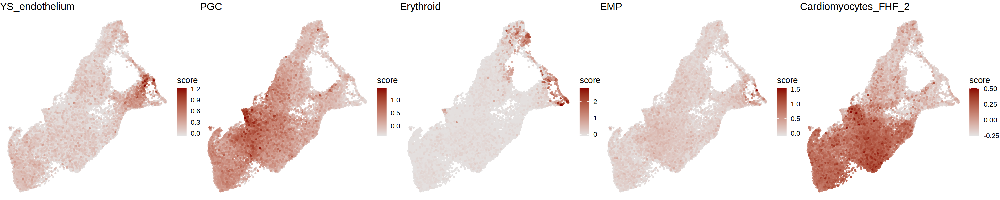

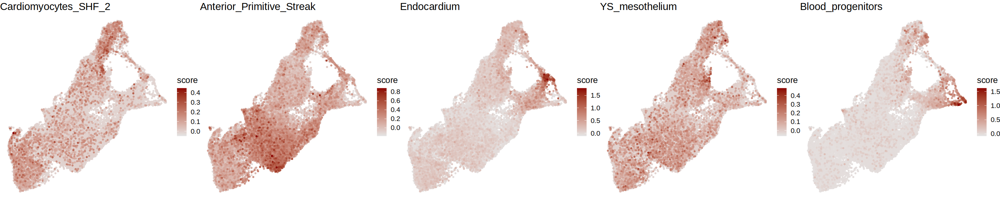

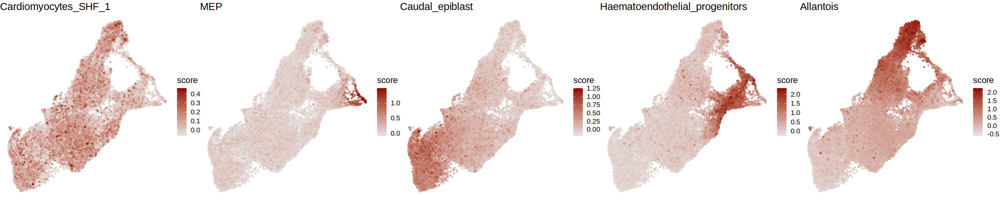

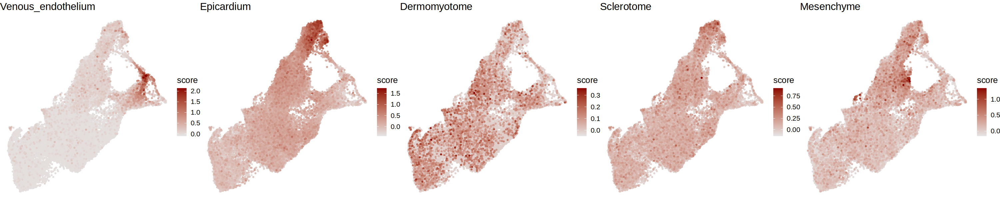

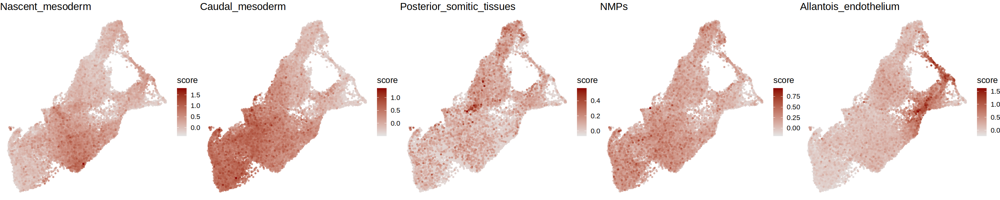

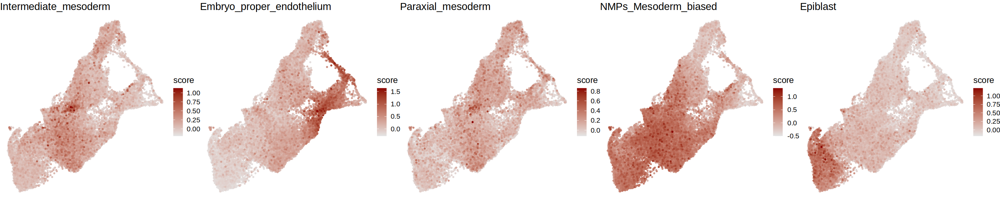

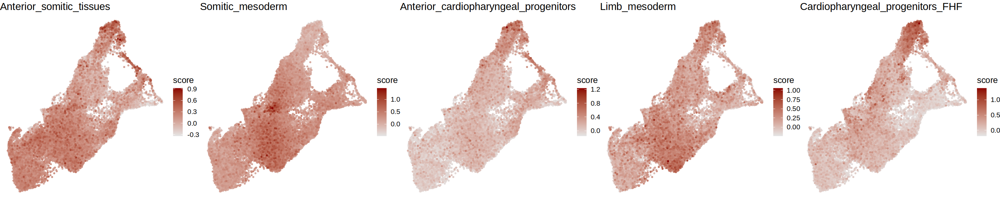

$`1`

$`2`

$`3`

$`4`

$`5`

$`6`

$`7`

$`8`

$`9`

attr(,"class")
[1] "list"      "ggarrange"

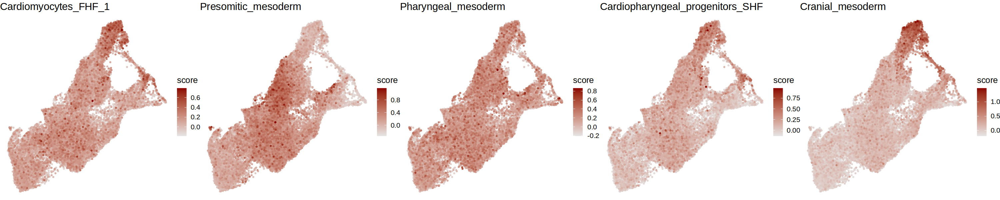

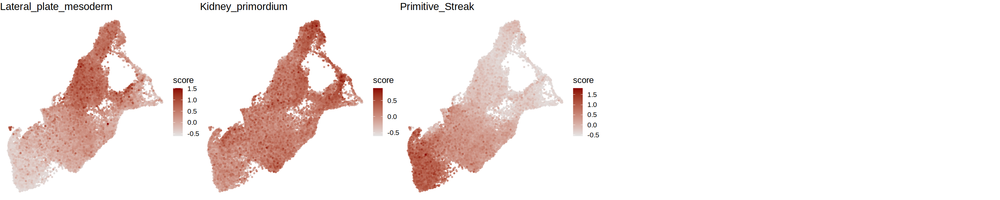

In [54]:
options(repr.plot.width=25, repr.plot.height=5)
ggarrange(plotlist=plots, ncol=5)

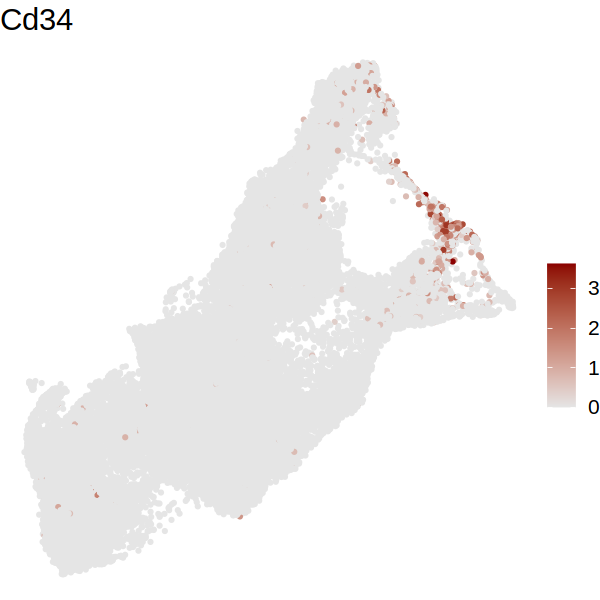

In [88]:
gene = 'Cd34'
options(repr.plot.width=5, repr.plot.height=5)

ggplot(umap, aes(UMAP1, UMAP2, col=as.vector(logcounts(sce[gene,umap$cell])))) +
        geom_point(size=0.7) +
        scale_color_gradient(low='gray90', high='darkred', name='') +
        ggtitle(gene) + 
        theme_void() + theme(text=element_text(size=15))

In [79]:
ep = head(markers[celltype=='Embryo_proper_endothelium', gene], 100)
al = head(markers[celltype=='Allantois_endothelium', gene], 100)

In [80]:
al[!al %in% ep]

[1] "Gja4"     "Sox18"    "Acvrl1"   "Plac1"    "Swap70"   "Pecam1"  
 [7] "Lyl1"     "Icam2"    "Ecscr"    "Cdh5"     "Ctla2a"   "Creb3l2" 
[13] "Nup62cl"  "Tm6sf1"   "Hoxa10"   "Cmtm8"    "Tek"      "Ets1"    
[19] "Cd34"     "BC028528" "Tspan18"  "Arpc1b"   "Hbegf"    "Ppp1r18" 
[25] "Zfp710"   "Sipa1"    "Fam65a"   "Amot"     "Cd59a"    "Hoxa9"   
[31] "Map3k11"  "Hmox1"    "Sft2d2"   "Orai3"    "Nrarp"    "Meg3"    
[37] "Pcgf5"    "Ets2"     "Crip2"

Warning message:
“The following features are not present in the object: Ptrf, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Fam65a, Fam46a, Fam212a, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Fam198b, Prkcdbp, Tmem2, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Wisp1, Sdpr, Fam46a, Gucy1b3, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Fam212a, Fam195a, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Fam212a, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Cxx1b, Cxx1a, Aes, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: Fam212a, not searching for symbol synonyms”
War

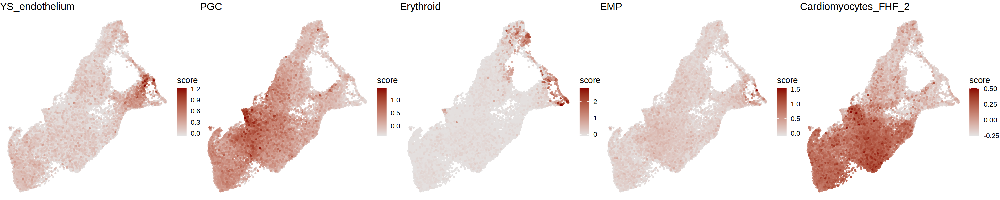

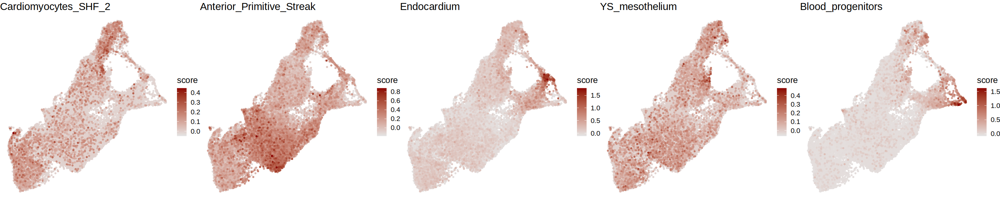

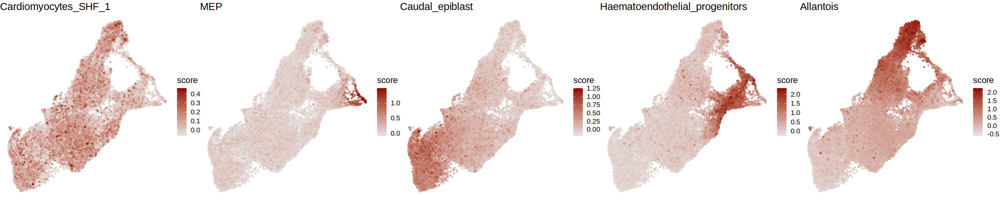

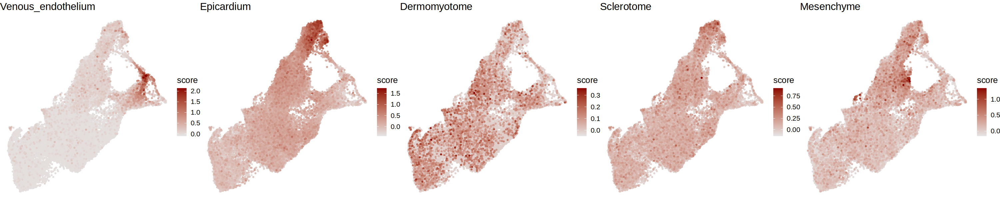

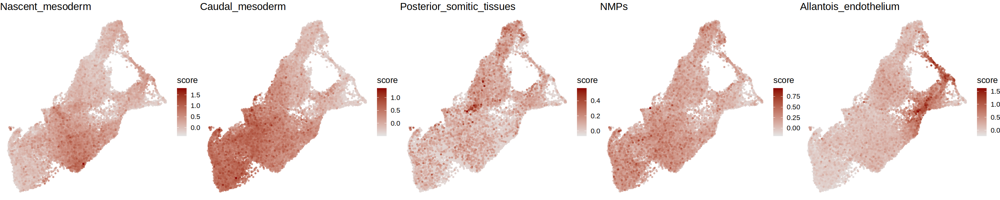

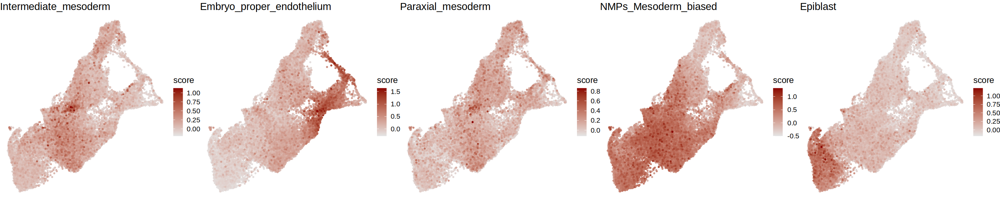

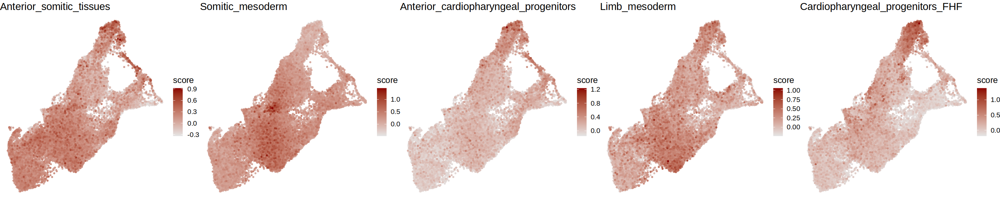

$`1`

$`2`

$`3`

$`4`

$`5`

$`6`

$`7`

$`8`

$`9`

attr(,"class")
[1] "list"      "ggarrange"

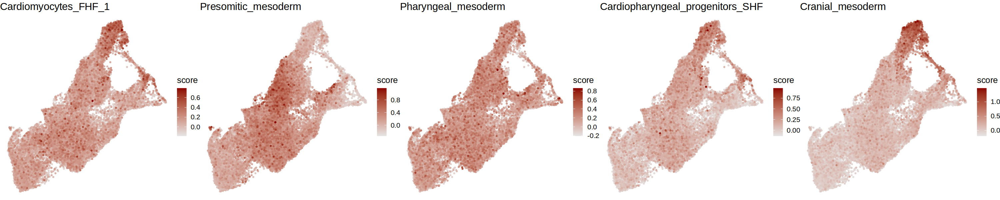

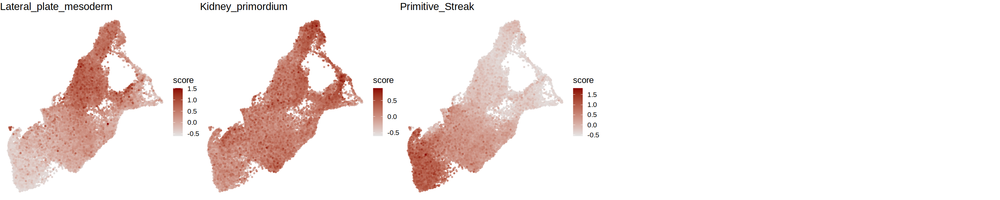

In [89]:
features = mclapply(unique(markers$celltype), function(x){
    tmp = markers[celltype==x & sig==TRUE] %>%
        .[order(-logFC),] %>% head(100) %>% .$gene
    return(tmp)
}, mc.cores=16)
names(features) = gsub('-', '_', unique(markers$celltype))

seurat = AddModuleScore(seurat, 
               features = features,
              name='celltypes_markers_')

scores = seurat@meta.data %>% .[,grep('celltypes_markers_', colnames(.))] %>% 
    setnames(names(features)) %>%
    as.data.table(keep.rownames=T) %>%
    setnames('rn', 'cell')

plots = lapply(colnames(scores[,-'cell']), function(x){
    umap = umap[order(umap[[x]])]
    plot = ggplot(umap, aes_string('UMAP1', 'UMAP2', col=x)) +
        geom_point(size=0.7) +
        scale_color_gradient(low='gray90', high='darkred', name='score') +
        ggtitle(x) + 
        theme_void() + theme(text=element_text(size=15))
})

options(repr.plot.width=25, repr.plot.height=5)
ggarrange(plotlist=plots, ncol=5)